In [1]:
%pylab inline

import os,sys
import numpy as np
import scipy as sp
import pandas as pd
import matplotlib as mpl
import matplotlib.gridspec as gridspec

from collections import defaultdict, Counter, OrderedDict

import cytograph as cg
import loompy
import palettable

sys.path.append(os.path.realpath(os.path.join(os.getcwd(), '..', '..')))
from scbeta_scrnaseq import utils
from scbeta_scrnaseq import vis
import scbeta_scrnaseq.cytograph_inmem_utils as cgm
import scbeta_scrnaseq.cytograph_analyses as cga



Populating the interactive namespace from numpy and matplotlib


## Data loading and parsing

We parse the inDrops pipeline output files, and create Loom objects for these datasets.

In [2]:
import stages3_to_6
obj_list = [
            stages3_to_6.x1_S6c, 
            stages3_to_6.x1_S5c, 
            stages3_to_6.x1_S4c, 
            stages3_to_6.x1_S3c,
            stages3_to_6.x2_S6c,
            stages3_to_6.x2_S5c, 
            stages3_to_6.x2_S4c, 
            stages3_to_6.x2_S3c, 
            ]

data_objs = {}
for obj in obj_list:
    data_objs[obj.sample] = obj('../data/indrops_intermediate')
    

In [3]:
samples = ["x1_S6c", "x1_S5c", "x1_S4c", "x1_S3c","x2_S6c","x2_S5c", "x2_S4c", "x2_S3c"]

In [7]:

min_cells_per_valid_gene = 10

%rm ../data/quality_filter/x*c.loom
%mkdir ../data/quality_filter/
for s in samples:
    counts = data_objs[s].counts.values.T
    cell_name = data_objs[s].counts.index
    cell_stage = int(s[4])*np.ones(cell_name.shape)
    cell_protocol = np.ones_like(cell_name)
    cell_protocol[:] = s.split('_')[0]
    cell_batch = np.array([c.split('.')[0] for c in cell_name])
    
    gene_name = data_objs[s].counts.columns

    loom_fn = f'../data/quality_filter/{s}.all_cells.raw.loom'
    loompy.create(loom_fn, {'': counts},
                      {'Gene': gene_name,
                       '_Valid': (counts.sum(1).A.ravel() > min_cells_per_valid_gene),
                          },
                      {'CellID': cell_name,
                       '_Valid': np.ones(cell_name.shape).astype(int),
                       'CellStage': cell_stage,
                       'CellProtocol' : cell_protocol,
                       'CellBatch': cell_batch, 
                          })
    

rm: ../data/quality_filter/*.loom: No such file or directory


In [9]:
# Load the Loom datasets (and immeditely load the counts to memory)
tds = OrderedDict()
for tp in samples:
    loom_fn = f'../data/quality_filter/{tp}.all_cells.raw.loom'
    tds[tp] = loompy.connect(loom_fn)
    tds[tp].vals = sp.sparse.csr_matrix(tds[tp].layers[""][:, :])

## 1. Quality filtering

### Automated filtering

In [19]:
# A note on seeds.
# Since we use community detection with large resolution parameters, different seeds will
# give different results. The same larger cluster can be sliced in a different smaller ones, which will produced
# different annotations at the filtering steps, and intermediate step, but consistent results
# once these smaller clusters are merged. 
# Ultimately, we find that only a small percentage of the cells have incompatible labels between different seeds.



seed = 38178714
for tp in tds.keys():
    cga.highvar_pca(tds[tp], tds[tp].vals, namespace='Raw', seed=seed)
    
    tds[tp].ca["RawHighVarTSNE"] = cg.TSNE(perplexity=100).layout(tds[tp].ca[r"RawHighVarPCA"])
    
    cga.low_qual_cluster_detector(tds[tp], tds[tp].vals,
        n_pcs = 50, nn_k=200, clustering_resolution = 1.0,
        n_markers = 50,
        seed=seed)

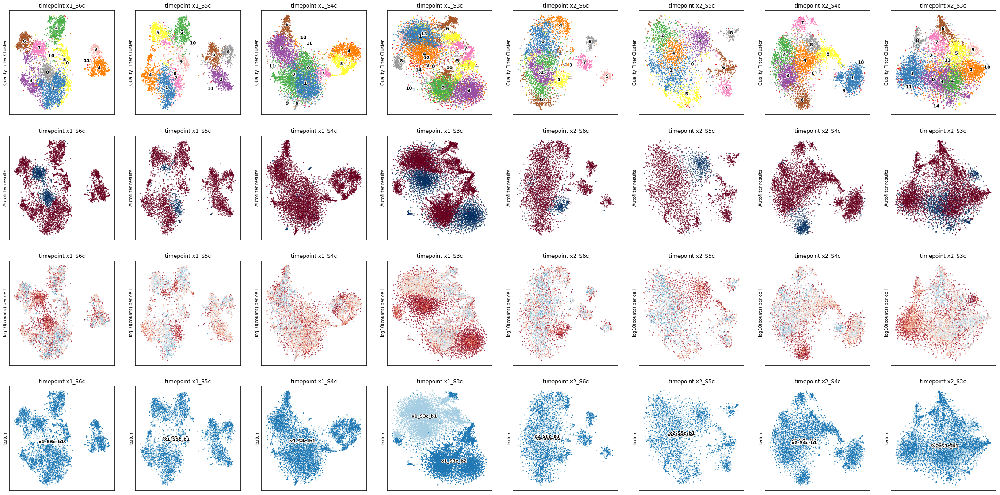

In [20]:
vis.plot_auto_qual_filter_by_time_point(ds_dict=tds, show_genes=[])

### Manual verification

The automated approach did well. Two changes we want to impose manually. First, for `x2_S3c`, we need to keep cluster 3 and remove cluster 1. For `x2_S5c`, we'd like to exclude part of cluster 6 (this will require splitting that cluster up first).

Start with `x2_S3c`:

In [21]:
manual_changes = defaultdict(lambda : dict(),
                            {'x2_S3c': {'force_false': [1,], 'force_true': [3,],}})

for tp in tds.keys():
    _tds = tds[tp]
    _tds.ca['__Filter2__Verified_quality'] = cgm.update_cluster_based_filter(
            _tds.ca['__Filter1__Automated_quality'],
            _tds.ca['QualFilterLabels'],
            **manual_changes[tp])

In [22]:
# There is a clear batch effect in x1_S3c -- this was visible on the BioA traces.
# Fortunately, it seems very simple to correct by doing a per-batch, mean-centering of each PC component.
# (we do this for the tSNE projection)

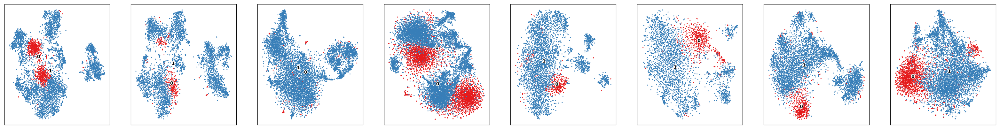

In [23]:
vis.plot_attr_by_time_point(tds, '__Filter2__Verified_quality')

Next, for `x2_S5c`, we first repeat the clustering process only for cluster 6, and then exclude the part making a low-depth cluster on the tSNE.

In [26]:
tp = 'x2_S5c'
_tds = tds[tp]

refined = cga.recluster_label(_tds.ca['RawHighVarPCA'], _tds.ca['QualFilterLabels'], (6,),
                              nn_k=100, min_cluster_size=10, seed=837611)
__filter2 = _tds.ca['__Filter2__Verified_quality']
__filter2[refined.original == 9] = 0

_tds.ca['__Filter2__Verified_quality'] = __filter2

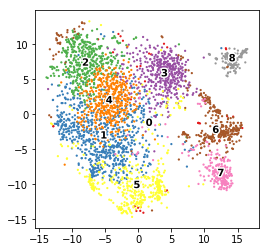

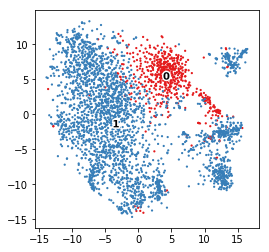

In [27]:
tsne_pos = _tds.ca['RawHighVarTSNE']
vis.scatter_cat(tsne_pos, _tds.ca['QualFilterLabels'])
vis.scatter_cat(tsne_pos, _tds.ca['__Filter2__Verified_quality'])

## 2. Clustering

In [28]:
seed = 67731210
for tp in tds.keys():
    _tds = tds[tp]
    
    _train_filter = _tds.ca['__Filter2__Verified_quality'] > 0
    _train_cells = np.where(_train_filter)[0]
    cga.highvar_pca(_tds, _tds.vals, namespace='Final', seed=seed, train_cells=_train_cells, n_highvar_pcs=50)
    
    _tds.ca['__Labels1__Clusters'] = cga.mknn_leiden_labels(_tds.ca['FinalHighVarPCA'][_train_filter], _train_filter,
                           nn_k=200, clustering_resolution=2.0).original

### Clustering refinement

We need to locally refine the clustering in order to correctly annotate the two most subtle features of the dataset. First, these are the SST/HHEX expressing cells present in stages 4+. Second, it's the replicating cells present in the later stages of `protocol x2` samples. This refinement is done below. 

#### SST/HHEX+ cell clusters. 

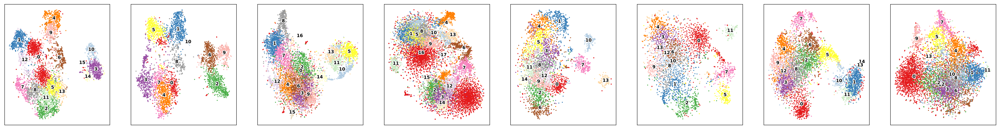

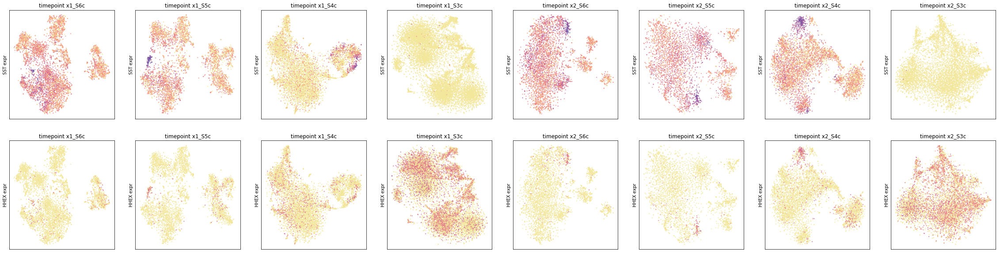

In [29]:
vis.plot_attr_by_time_point(tds, '__Labels1__Clusters', min_elements_for_label=5)
vis.plot_gene_by_time_point(tds, ['SST', 'HHEX'])

In [32]:
refinement_params = { 
                       'x1_S6c': ((12,), 0.8),
                       'x1_S5c': ((3,), 0.3),
                       'x1_S4c': ((10,), 0.5),
                       'x2_S6c': ((1,), 0.5),
                       'x2_S5c': ((2,), 0.5),
                    }

input_attr, output_attr = ('__Labels1__Clusters', '__Labels2__Refined1')
                                                                           
for tp in tds.keys():
    _tds = tds[tp]
    _cluster_labels = _tds.ca[input_attr]
    
    if tp not in refinement_params:
        _tds.ca[output_attr] = _cluster_labels
        continue
    
    _labels_to_refine, clustering_resolution = refinement_params[tp]
    refined = cga.recluster_label(_tds.ca['FinalHighVarPCA'], _cluster_labels, _labels_to_refine,
                              nn_k=100, min_cluster_size=10, seed=5140621, clustering_resolution=clustering_resolution)
    _tds.ca[output_attr] = refined.original
    


### Replicating cells clusters

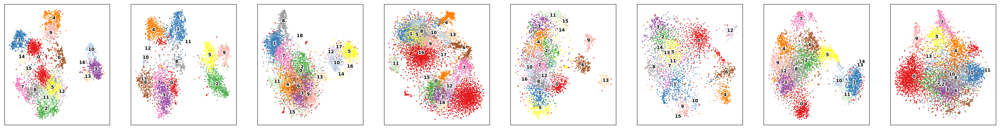

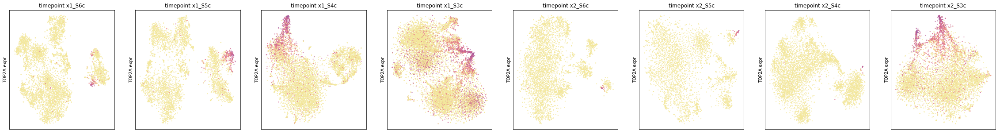

In [33]:
vis.plot_attr_by_time_point(tds, '__Labels2__Refined1', min_elements_for_label=5)
vis.plot_gene_by_time_point(tds, ['TOP2A'])

In [34]:
# refinement_params = { 
#                        'x2_S6c': ((13,), 0.5),
#                        'x2_S5c': ((12,), 0.9),
#                     }
# input_attr, output_attr = ('__Labels2__Refined1', '__Labels3__FinalClusters')

# for tp in tds.keys():
#     _tds = tds[tp]
#     _cluster_labels = _tds.ca[input_attr]
    
#     if tp not in refinement_params:
#         _tds.ca[output_attr] = _cluster_labels
#         continue
    
#     _labels_to_refine, clustering_resolution = refinement_params[tp]
#     refined = cga.recluster_label(_tds.ca['FinalHighVarPCA'], _cluster_labels, _labels_to_refine,
#                               nn_k=100, min_cluster_size=10, seed=82789181, clustering_resolution=clustering_resolution)
#     _tds.ca[output_attr] = refined.original


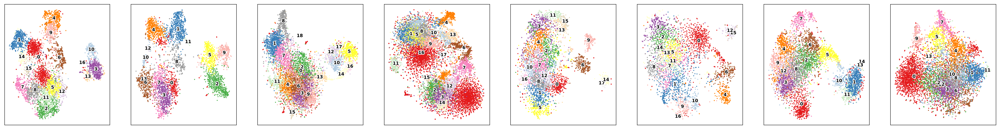

In [35]:
 
vis.plot_attr_by_time_point(tds, '__Labels3__FinalClusters', min_elements_for_label=5)


## 3. Interpret the clusters

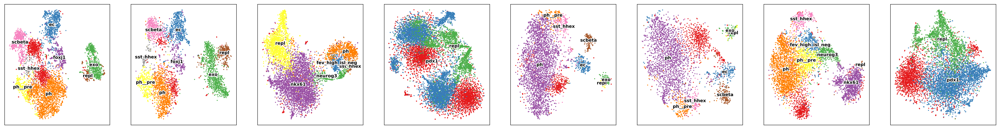

In [37]:
for tp in tds.keys():
    _tds = tds[tp]
    
    # Compute pseudo-bulked counts over clusters
    pb_labels = cgm.CellLabels(_tds.ca['__Labels3__FinalClusters'])
    cluster_pseudobulk = cga.pseudobulk_from_label(_tds, pb_labels)
    cluster_pseudobulk_z = ((cluster_pseudobulk - cluster_pseudobulk.mean())/cluster_pseudobulk.std()).fillna(0.0)
    
    # Load the auto-labeling markers
    autolabel_enrichment = utils.load_df(f'../data/clustering/{tp}.autolabels.df.npz')
    
    # Correlated the markers with the clusters
    autolabel_corr = pd.DataFrame(utils.two_array_corr((autolabel_enrichment > 0).astype(float).values,
                                                   cluster_pseudobulk_z.T.loc[autolabel_enrichment.index].values),
                                 columns = autolabel_enrichment.columns,
                                 index=cluster_pseudobulk_z.T.columns)
    
    autolabel_calls = autolabel_corr.idxmax(1).to_dict()
    # Assign the null label
    autolabel_calls[0] = ''
    
    ann_labels = cgm.CellLabels(np.array([autolabel_calls[li] for li in pb_labels.original]), null_label='')

    _tds.ca['__Labels4__AnnotatedLabels'] = ann_labels.original


vis.plot_attr_by_time_point(tds, '__Labels4__AnnotatedLabels', min_elements_for_label=5, int_categories=False)


## 4. Update label assignment using classification

In [40]:
for tp in tds.keys():
    _tds = tds[tp]
    ann_labels = cgm.CellLabels(_tds.ca['__Labels4__AnnotatedLabels'], null_label="")
    
    if tp in ['x1_S3c', 'x2_S3c']:
        # This doesn't look all that good, so we best exclude those low-quality cells.
        do_not_classify = ~_tds.ca['__Filter2__Verified_quality'].astype(bool)
    else:
        # Classify everything
        do_not_classify = np.zeros_like(_tds.ca['__Filter2__Verified_quality']).astype(bool)
        
    classifier_labels = cga.update_labels_with_classifier(_tds, ann_labels, seed=189122,
                                                      do_not_classify_filter= do_not_classify,
                                                      recovery_classification_threshold=0.50)

    _tds.ca['__Labels5__ClassifierLabels_detailed'] = classifier_labels.original
    _tds.ca['__Labels6__ClassifierLabels'] = [s.split('__')[0] for s in classifier_labels.original]

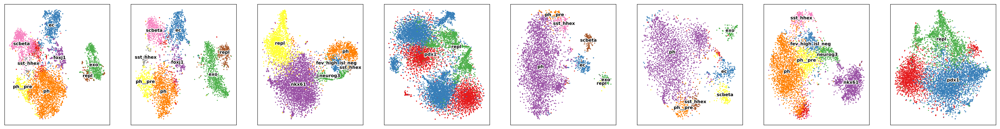

In [41]:
vis.plot_attr_by_time_point(tds, '__Labels5__ClassifierLabels_detailed', min_elements_for_label=5, int_categories=False)


In [50]:
Counter(tds['x1_S6c'].ca.__Labels5__ClassifierLabels)

Counter({'ph': 1983,
         'ec': 812,
         'scbeta': 792,
         'exo': 734,
         '': 323,
         'ph__pre': 348,
         'repl': 132,
         'foxj1': 337,
         'sst_hhex': 54})

In [52]:
_tds = tds['x1_S6c']
len(np.where(_tds.ca.__Labels5__ClassifierLabels != '')[0])

5192

In [55]:
len(_tds.ca.__Labels5__ClassifierLabels) - 323

5192

In [59]:
attributes_to_copy = [
    ('CellID', 'CellID'),
    ('CellBatch', 'CellBatch'),
    ('CellStage', 'CellStage'),
    ('CellProtocol', 'CellProtocol'),
    ('_Valid', '_Valid'),
    ('__Labels6__ClassifierLabels', 'Labels'),
    ('__Labels5__ClassifierLabels_detailed', 'DetailedLabels'),
    ('__Filter2__Verified_quality', '_TrainFilter'),
    ]

%rm ../data/complete_processing/*.loom
%mkdir ../data/complete_processing/
min_cells_per_valid_gene = 10
for tp in tds.keys():
    _tds = tds[tp]
    
    new_loom_fn = f'../data/complete_processing/{tp}.processed.loom'
    
    f_cells = np.where(_tds.ca.__Labels5__ClassifierLabels_detailed != '')[0]
    loompy.create(new_loom_fn, {'': _tds.vals[:, f_cells]},
                  {'Gene': _tds.ra.Gene,
                   '_Valid': (_tds.vals[:, f_cells].sum(1).A.ravel() > min_cells_per_valid_gene)
                      },
                  {new_attr_name: _tds.ca[old_attr_name][f_cells] for old_attr_name, new_attr_name in attributes_to_copy},
                 )


mkdir: ../data/complete_processing/: File exists


In [6]:
# Load the Loom datasets (and immeditely load the counts to memory)
ctds = OrderedDict()
for tp in samples:
    loom_fn = f'../data/complete_processing/{tp}.processed.loom'
    ctds[tp] = loompy.connect(loom_fn)
    ctds[tp].vals = sp.sparse.csr_matrix(ctds[tp].layers[""][:, :])

In [ ]:
choose_tsne = {"x1_S3c": "tsne_proj.x1_S3c.2018_12_14_r1.n_hvgs2000.npcs25.p200.s3452921.i10000",
"x1_S4c": "tsne_proj.x1_S4c.2018_12_14_r1.n_hvgs2000.npcs25.p200.s3452922.i10000",
"x1_S5c": "tsne_proj.x1_S5c.2018_12_14_r1.n_hvgs2000.npcs25.p200.s3452914.i10000",
"x1_S6c": "tsne_proj.x1_S6c.2018_12_14_r1.n_hvgs2000.npcs25.p200.s3452926.i10000",
"x2_S3c": "tsne_proj.x2_S3c.2018_12_14_r1.n_hvgs2000.npcs25.p200.s3452914.i10000",
"x2_S4c": "tsne_proj.x2_S4c.2018_12_14_r1.n_hvgs2000.npcs25.p200.s3452915.i10000",
"x2_S5c": "tsne_proj.x2_S5c.2018_12_14_r1.n_hvgs2000.npcs25.p200.s3452921.i10000",
"x2_S6c": "tsne_proj.x2_S6c.2018_12_14_r1.n_hvgs2000.npcs25.p200.s3452924.i10000",}

In [2]:
seed = 77190192
for tp in ctds.keys():
    _tds = ctds[tp]
    
    print(tp, sum(_tds.ca.DetailedLabels == ''))

NameError: name 'ctds' is not defined

In [7]:

tsne_mass_dir = "/Volumes/beta_cell/Users/adrianveres/data/Computation/Stage3_6/2018-12-14/"

choose_tsne = {"x1_S3c": "tsne_proj.x1_S3c.2018_12_14_r1.n_hvgs2000.npcs25.p200.s3452921.i10000",
"x1_S4c": "tsne_proj.x1_S4c.2018_12_14_r1.n_hvgs2000.npcs25.p200.s3452922.i10000",
"x1_S5c": "tsne_proj.x1_S5c.2018_12_14_r1.n_hvgs2000.npcs25.p200.s3452914.i10000",
"x1_S6c": "tsne_proj.x1_S6c.2018_12_14_r1.n_hvgs2000.npcs25.p200.s3452926.i10000",
"x2_S3c": "tsne_proj.x2_S3c.2018_12_14_r1.n_hvgs2000.npcs25.p200.s3452914.i10000",
"x2_S4c": "tsne_proj.x2_S4c.2018_12_14_r1.n_hvgs2000.npcs25.p200.s3452915.i10000",
"x2_S5c": "tsne_proj.x2_S5c.2018_12_14_r1.n_hvgs2000.npcs25.p200.s3452921.i10000",
"x2_S6c": "tsne_proj.x2_S6c.2018_12_14_r1.n_hvgs2000.npcs25.p200.s3452924.i10000",}

for tp in samples:
    _tds = ctds[tp]
    tsne = utils.load_df(tsne_mass_dir + '/tsne/'+ choose_tsne[tp] + '.df.npz')
    
    
    new_tsne = tsne.loc[_tds.ca.CellID]
    new_cell = np.array([c not in tsne.index for c in _tds.ca.CellID])

    for c in new_tsne[new_cell].index:

        ci = np.where(_tds.ca.CellID == c)[0]

        clabel = _tds.ca.DetailedLabels[ci][0]

        like_label = np.where((_tds.ca.DetailedLabels == clabel) & (~new_cell))[0]
        sampled_like_labels = np.random.choice(like_label, size=10, replace=False)

        new_tsne.loc[c] = new_tsne.loc[_tds.ca.CellID[sampled_like_labels]].mean()
    
    
    utils.save_df(new_tsne, f'../data/complete_processing/{tp}.tsne.df.npz')

/Users/averes/miniconda3/envs/py36/lib/python3.6/site-packages/ipykernel_launcher.py:18: FutureWarning: 
Passing list-likes to .loc or [] with any missing label will raise
KeyError in the future, you can use .reindex() as an alternative.

See the documentation here:
https://pandas.pydata.org/pandas-docs/stable/indexing.html#deprecate-loc-reindex-listlike


In [8]:

tsne_mass_dir = "/Volumes/beta_cell/Users/adrianveres/data/Computation/Stage3_6/2018-12-14/"

choose_tsne = {"x1_S3c": "tsne_proj.x1_S3c.2018_12_14_r1.n_hvgs2000.npcs25.p200.s3452921.i10000",
"x1_S4c": "tsne_proj.x1_S4c.2018_12_14_r1.n_hvgs2000.npcs25.p200.s3452922.i10000",
"x1_S5c": "tsne_proj.x1_S5c.2018_12_14_r1.n_hvgs2000.npcs25.p200.s3452914.i10000",
"x1_S6c": "tsne_proj.x1_S6c.2018_12_14_r1.n_hvgs2000.npcs25.p200.s3452926.i10000",
"x2_S3c": "tsne_proj.x2_S3c.2018_12_14_r1.n_hvgs2000.npcs25.p200.s3452914.i10000",
"x2_S4c": "tsne_proj.x2_S4c.2018_12_14_r1.n_hvgs2000.npcs25.p200.s3452915.i10000",
"x2_S5c": "tsne_proj.x2_S5c.2018_12_14_r1.n_hvgs2000.npcs25.p200.s3452921.i10000",
"x2_S6c": "tsne_proj.x2_S6c.2018_12_14_r1.n_hvgs2000.npcs25.p200.s3452924.i10000",}

for tp in samples:
    _tds = ctds[tp]
    tsne = utils.load_df(f'../data/complete_processing/{tp}.tsne.df.npz')
    
    ctds[tp].ca['TSNE'] = tsne.loc[_tds.ca.CellID].values
    ctds[tp].close()

In [41]:
seed = 77190192
for tp in ctds.keys():
    _tds = ctds[tp]
    
    _train_filter = _tds.ca['_TrainFilter'] > 0
    _train_cells = np.where(_train_filter)[0]
    cga.highvar_pca(_tds, _tds.vals, namespace='', seed=seed, train_cells=_train_cells, n_highvar_pcs=50)
    
    np.random.seed(seed)
    _tds.ca["HighVarTSNE"] = cg.TSNE(perplexity=100).layout(_tds.ca[r"HighVarPCA"])


In [1]:
1-1

0

In [42]:

# for tp in ctds.keys():
#     _tds = ctds[tp].close()
    